Task: Geospatial Analysis

Visualize the locations of restaurants on a
map using latitude and longitude
information.

Analyze the distribution of restaurants
across different cities or countries.
Determine if there is any correlation
between the restaurant's location and its
rating.

In [5]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import folium

In [10]:
df=pd.read_csv(r"C:\Users\visha\OneDrive\Desktop\internship_task\Dataset .csv")

In [11]:
df

,Restaurant ID,Restaurant Name,Country Code,City,Address,Locality,Locality Verbose,Longitude,Latitude,Cuisines,...,Currency,Has Table booking,Has Online delivery,Is delivering now,Switch to order menu,Price range,Aggregate rating,Rating color,Rating text,Votes
0,6317637,Le Petit Souffle,162,Makati City,"Third Floor, Century City Mall, Kalayaan Avenu...","Century City Mall, Poblacion, Makati City","Century City Mall, Poblacion, Makati City, Mak...",121.027535,14.565443,"French, Japanese, Desserts",...,Botswana Pula(P),Yes,No,No,No,3,4.8,Dark Green,Excellent,314
1,6304287,Izakaya Kikufuji,162,Makati City,"Little Tokyo, 2277 Chino Roces Avenue, Legaspi...","Little Tokyo, Legaspi Village, Makati City","Little Tokyo, Legaspi Village, Makati City, Ma...",121.014101,14.553708,Japanese,...,Botswana Pula(P),Yes,No,No,No,3,4.5,Dark Green,Excellent,591
2,6300002,Heat - Edsa Shangri-La,162,Mandaluyong City,"Edsa Shangri-La, 1 Garden Way, Ortigas, Mandal...","Edsa Shangri-La, Ortigas, Mandaluyong City","Edsa Shangri-La, Ortigas, Mandaluyong City, Ma...",121.056831,14.581404,"Seafood, Asian, Filipino, Indian",...,Botswana Pula(P),Yes,No,No,No,4,4.4,Green,Very Good,270
3,6318506,Ooma,162,Mandaluyong City,"Third Floor, Mega Fashion Hall, SM Megamall, O...","SM Megamall, Ortigas, Mandaluyong City","SM Megamall, Ortigas, Mandaluyong City, Mandal...",121.056475,14.585318,"Japanese, Sushi",...,Botswana Pula(P),No,No,No,No,4,4.9,Dark Green,Excellent,365
4,6314302,Sambo Kojin,162,Mandaluyong City,"Third Floor, Mega Atrium, SM Megamall, Ortigas...","SM Megamall, Ortigas, Mandaluyong City","SM Megamall, Ortigas, Mandaluyong City, Mandal...",121.057508,14.584450,"Japanese, Korean",...,Botswana Pula(P),Yes,No,No,No,4,4.8,Dark Green,Excellent,229
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9546,5915730,Naml۱ Gurme,208,��stanbul,"Kemanke�� Karamustafa Pa��a Mahallesi, R۱ht۱m ...",Karak�_y,"Karak�_y, ��stanbul",28.977392,41.022793,Turkish,...,Turkish Lira(TL),No,No,No,No,3,4.1,Green,Very Good,788
9547,5908749,Ceviz A��ac۱,208,��stanbul,"Ko��uyolu Mahallesi, Muhittin ��st�_nda�� Cadd...",Ko��uyolu,"Ko��uyolu, ��stanbul",29.041297,41.009847,"World Cuisine, Patisserie, Cafe",...,Turkish Lira(TL),No,No,No,No,3,4.2,Green,Very Good,1034
9548,5915807,Huqqa,208,��stanbul,"Kuru�_e��me Mahallesi, Muallim Naci Caddesi, N...",Kuru�_e��me,"Kuru�_e��me, ��stanbul",29.034640,41.055817,"Italian, World Cuisine",...,Turkish Lira(TL),No,No,No,No,4,3.7,Yellow,Good,661
9549,5916112,A���k Kahve,208,��stanbul,"Kuru�_e��me Mahallesi, Muallim Naci Caddesi, N...",Kuru�_e��me,"Kuru�_e��me, ��stanbul",29.036019,41.057979,Restaurant Cafe,...,Turkish Lira(TL),No,No,No,No,4,4.0,Green,Very Good,901


In [12]:
df['Latitude']

0       14.565443
1       14.553708
2       14.581404
3       14.585318
4       14.584450
          ...    
9546    41.022793
9547    41.009847
9548    41.055817
9549    41.057979
9550    40.984776
Name: Latitude, Length: 9551, dtype: float64

In [13]:
df['Longitude']

0       121.027535
1       121.014101
2       121.056831
3       121.056475
4       121.057508
           ...    
9546     28.977392
9547     29.041297
9548     29.034640
9549     29.036019
9550     29.026016
Name: Longitude, Length: 9551, dtype: float64

In [14]:
# Filter necessary columns (assuming columns 'Latitude', 'Longitude', 'Rating', 'City')
df_map = df[['Latitude', 'Longitude','Aggregate rating','City']].dropna()

# Initialize a folium map centered at an approximate location (adjust lat/long as needed)
map_center = [df_map['Latitude'].mean(), df_map['Longitude'].mean()]
restaurant_map = folium.Map(location=map_center, zoom_start=10)




In [16]:
# Add restaurant locations to the map
for idx, row in df_map.iterrows():
    popup_info = f"Rating: {row['Aggregate rating']}<br>City: {row['City']}"
    folium.Marker([row['Latitude'], row['Longitude']], 
                  popup=popup_info).add_to(restaurant_map)


In [17]:
# Display the map
restaurant_map.save('restaurants_map.html')
restaurant_map

C:\Users\visha\AppData\Local\Temp\ipykernel_23124\473551624.py:4: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=city_counts.values, y=city_counts.index, palette="viridis")


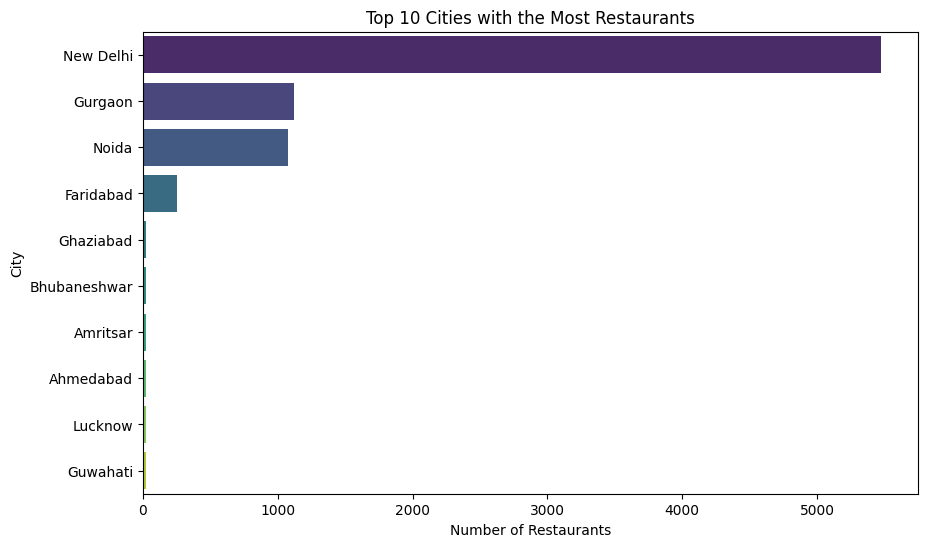

In [18]:

# Top 10 Cities with the Most Restaurants
city_counts = df['City'].value_counts().head(10)
plt.figure(figsize=(10,6))
sns.barplot(x=city_counts.values, y=city_counts.index, palette="viridis")
plt.title('Top 10 Cities with the Most Restaurants')
plt.xlabel('Number of Restaurants')
plt.ylabel('City')
plt.show()


C:\Users\visha\AppData\Local\Temp\ipykernel_23124\2971939600.py:4: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=country_counts.values, y=country_counts.index, palette="viridis")


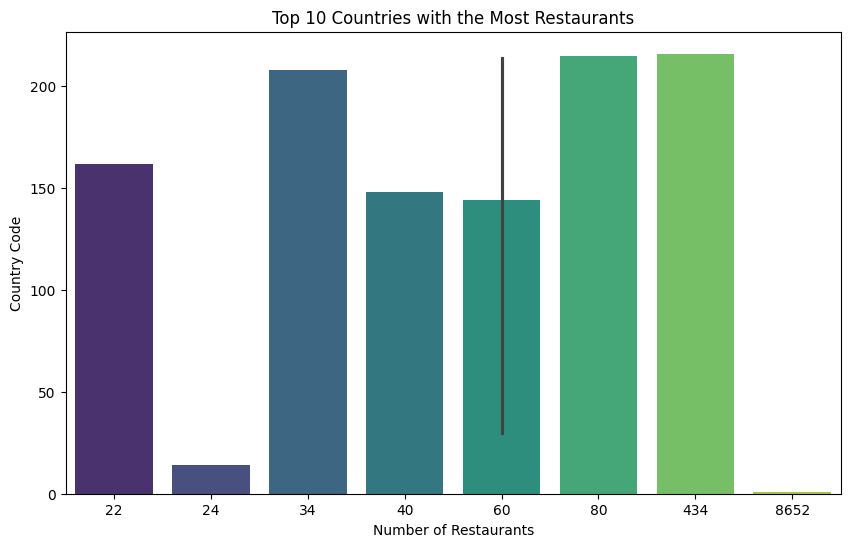

In [20]:

# Top 10 Countries with the Most Restaurants
country_counts = df['Country Code'].value_counts().head(10)
plt.figure(figsize=(10,6))
sns.barplot(x=country_counts.values, y=country_counts.index, palette="viridis")
plt.title('Top 10 Countries with the Most Restaurants')
plt.xlabel('Number of Restaurants')
plt.ylabel('Country Code')
plt.show()


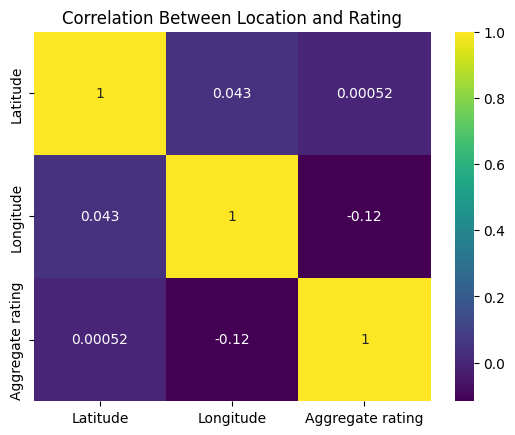

In [27]:

# Correlation analysis using correlation matrix
correlation_matrix = df_map[['Latitude', 'Longitude', 'Aggregate rating']].corr()
sns.heatmap(correlation_matrix, annot=True, cmap='viridis')
plt.title('Correlation Between Location and Rating')
plt.show()
